In [1]:
!nvidia-smi
import tensorflow as tf

print("Tensorflow version: {}" .format(tf.__version__))
# Check for GPU
print("GPU: ", "Available ^w^" if tf.config.list_physical_devices("GPU") else "Not available qwq")

Wed Jul  9 10:45:32 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 576.88                 Driver Version: 576.88         CUDA Version: 12.9     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 3050 ...  WDDM  |   00000000:01:00.0 Off |                  N/A |
| N/A   49C    P8              6W /   75W |       0MiB /   4096MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
import numpy as np
import os
import cv2
from matplotlib import pyplot as plt
from IPython.display import clear_output
from keras.layers import Input

import tkinter as tk
from tkinter import filedialog, ttk, messagebox
from PIL import Image, ImageTk
from pathlib import Path
import threading
import json

IMG_DATABASE = 'D:\Project Internal\Dataset Baru'
DIMS = (224,224)  # (width, height)
INPUT_TENSOR = Input(shape=(480,320,3))  # (height, width, channel)

# Select Model as Feature Extractor

In [ ]:
from tensorflow.keras.applications.resnet_v2 import ResNet50V2, preprocess_input

model_name = "ResNet50V2"
model = ResNet50V2(
    input_shape=(224, 224, 3), # Ukuran input yang umum untuk ResNet50V2
    include_top=False,
    weights='imagenet'
)

29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 10s 0us/step


# Distance Similarity Measures

In [4]:
# Measure the feature similarity
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.metrics.pairwise import manhattan_distances
from sklearn.metrics.pairwise import cosine_distances
from sklearn.metrics.pairwise import pairwise_distances

def euclidean(features1, features2):
    distance = euclidean_distances([features1], [features2])
    return distance[0][0]

def manhattan(features1, features2):
    distance = manhattan_distances([features1], [features2])
    return distance[0][0]

def cosine(features1, features2):
    distance = cosine_distances([features1], [features2])
    return distance[0][0]

def minkowski(features1, features2):
    distance = pairwise_distances([features1], [features2], metric='minkowski', p=3)
    return distance[0][0]

In [5]:
# Extract the image features
def extract_features(image_path):
    img = cv2.imread(image_path)
    img = cv2.resize(img, DIMS)
    filtered = cv2.bilateralFilter(img, 9, 150, 150)
    img = np.expand_dims(filtered, axis=0)
    img = preprocess_input(img)
    features = model.predict(img)
    features = features.flatten()
    return features

# Extract Images Features

In [6]:
file_path = []
for dirname, _, filenames in os.walk(IMG_DATABASE):
    for filename in filenames:
        file_path.append(os.path.join(dirname, filename))

In [7]:
features = []
for file in file_path:
    print("Extracting features from", file.split("\\")[1:])
    feature = extract_features(file)
    features.append(feature)
    clear_output(wait=True)

Extracting features from ['Project Internal', 'Dataset Baru', 'Powdery Mildew Leaf', 'powdery_mildew_leaf520.jpg']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


In [ ]:
# Save features database to cache
np.save("Strawberry_ResNet50V2.npy", file_path)
np.save("StrawberryFeatures_ResNet50V2.npy", features)

In [ ]:
# Load fetures database from cache
file_path = np.load("Strawberry_ResNet50V2.npy")
features = np.load("StrawberryFeatures_ResNet50V2.npy")

# Return Similar Images

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


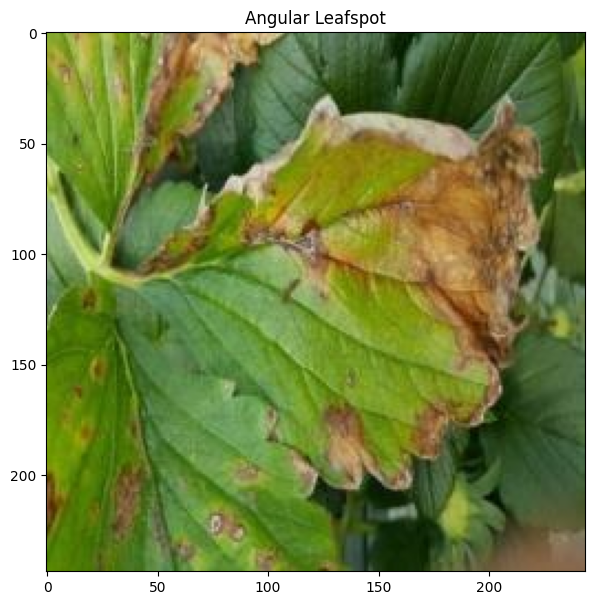

In [ ]:
from pathlib import Path
import matplotlib.pyplot as plt

IMG_QUERY = r"D:\Project Internal\Dataset Baru\Healthy\20250226_120903.jpg"
query_label = Path(IMG_QUERY).parent.name

query_features = extract_features(IMG_QUERY)

plt.figure(figsize=(7, 7))
plt.imshow(plt.imread(IMG_QUERY))
plt.title(query_label)
plt.show()


In [ ]:
result_euclidean = []
for i in range(len(file_path)):
    distance = euclidean(query_features, features[i])
    result_euclidean.append((distance, file_path[i]))

result_euclidean = sorted(result_euclidean)

precision = []
hit = 0
i = 1

for distance, file in result_euclidean:
    label = os.path.normpath(file).split(os.sep)[-2]
    if query_label.lower().strip() == label.lower().strip():
        hit += 1
        precision.append(hit / i)
    i += 1

if precision:
    print(f"\nEuclidean Average Precision: {np.mean(precision):.3f}")
else:
    print("\nTidak ada label yang cocok. Precision = 0.000")



Euclidean Average Precision: 0.167


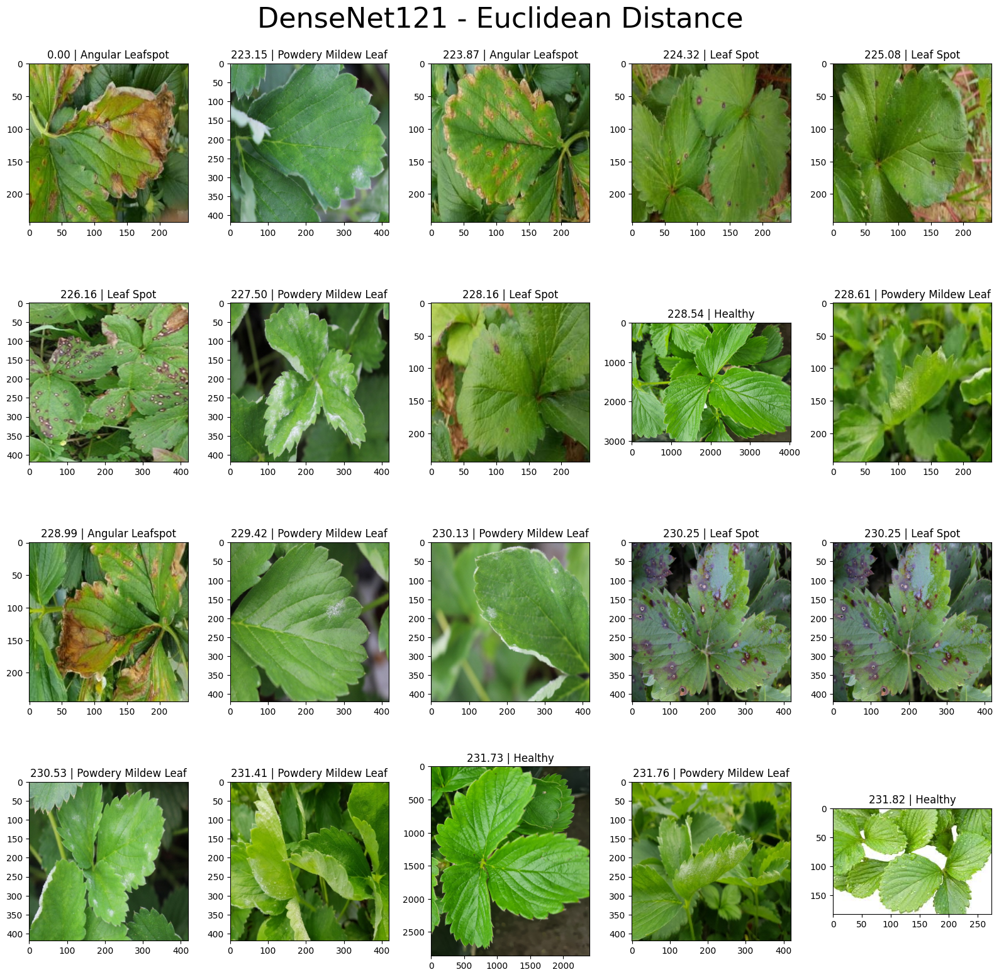

In [12]:
plt.figure(figsize=(16,16))
for i in range(min(20, len(result_euclidean))):
    distance = result_euclidean[i][0]
    path = result_euclidean[i][1]
    parts = path.split("\\")
    label = parts[3] if len(parts) > 1 else "Unknown"
    
    plt.subplot(4, 5, i+1)
    plt.title(f"{distance:.2f} | {label}")
    plt.imshow(plt.imread(path))

plt.suptitle(f"{model_name} - Euclidean Distance", fontsize=32)
plt.tight_layout()
plt.show()


In [ ]:
result_manhattan = []
for i in range(len(file_path)):
    distance = manhattan(query_features, features[i])
    result_manhattan.append((distance, file_path[i]))

result_manhattan = sorted(result_manhattan)

precision = []
hit = 0
i = 1

for distance, file in result_manhattan:
    label = os.path.normpath(file).split(os.sep)[-2]
    if query_label.lower().strip() == label.lower().strip():
        hit += 1
        precision.append(hit / i)
    i += 1

if precision:
    print(f"\nManhattan Average Precision: {np.mean(precision):.3f}")
else:
    print("\nTidak ada label yang cocok. Precision = 0.000")



Manhattan Average Precision: 0.169


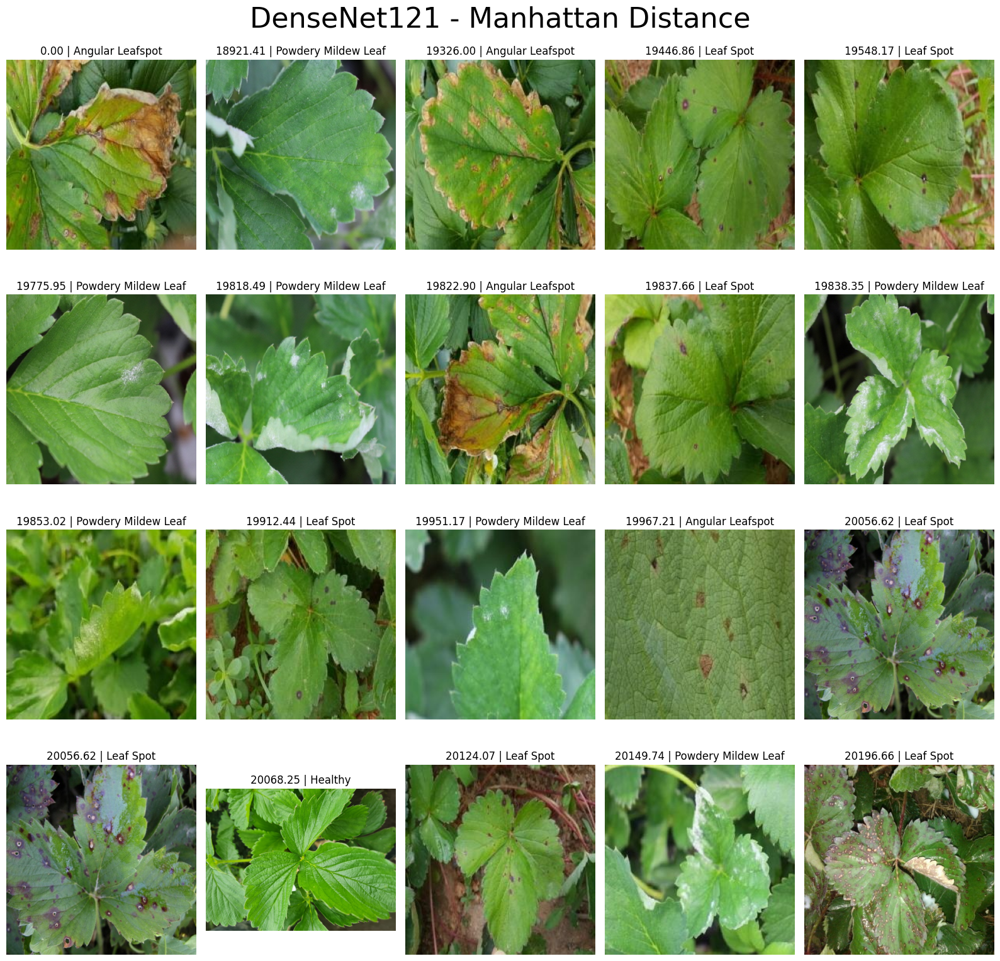

In [14]:
import os
import matplotlib.pyplot as plt

plt.figure(figsize=(16, 16))
for i in range(min(20, len(result_manhattan))):  # jaga-jaga kalau hasilnya < 20
    distance = result_manhattan[i][0]
    label = os.path.basename(os.path.dirname(result_manhattan[i][1]))

    plt.subplot(4, 5, i + 1)
    plt.title(f"{distance:.2f} | {label}")
    plt.imshow(plt.imread(result_manhattan[i][1]))
    plt.axis('off')

plt.suptitle(f"{model_name} - Manhattan Distance", fontsize=32)
plt.tight_layout()
plt.show()


In [ ]:
result_cosine = []
for i in range(len(file_path)):
    distance = cosine(query_features, features[i])
    result_cosine.append((distance, file_path[i]))

result_cosine = sorted(result_cosine)

precision = []
hit = 0
i = 1

for distance, file in result_cosine:
    label = os.path.normpath(file).split(os.sep)[-2]
    if query_label.lower().strip() == label.lower().strip():
        hit += 1
        precision.append(hit / i)
    i += 1

if precision:
    print(f"\nCosine Average Precision: {np.mean(precision):.3f}")
else:
    print("\nTidak ada label yang cocok. Precision = 0.000")



Cosine Average Precision: 0.145


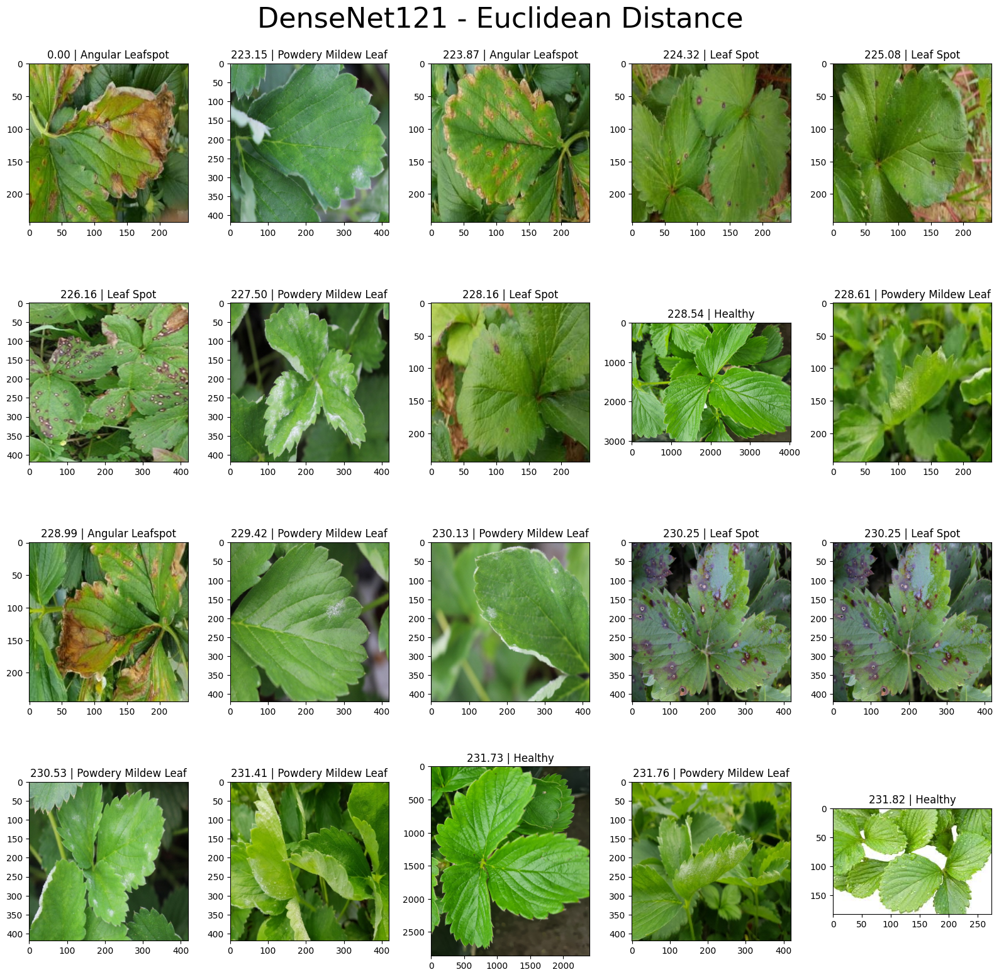

In [16]:
plt.figure(figsize=(16,16))
for i in range(20):
    distance = result_euclidean[i][0]
    label = result_euclidean[i][1].split("\\")[3]
    
    plt.subplot(4, 5, i+1)
    plt.title(str(f"{distance:.2f} | {label}"))
    plt.imshow(plt.imread(result_euclidean[i][1]))

plt.suptitle(f"{model_name} - Euclidean Distance", fontsize=32)
plt.tight_layout()
plt.show()

In [ ]:
result_minkowski = []
for i in range(len(file_path)):
    distance = minkowski(query_features, features[i])
    result_minkowski.append((distance, file_path[i]))

result_minkowski = sorted(result_minkowski)

precision = []
hit = 0
i = 1

for distance, file in result_minkowski:
    label = os.path.normpath(file).split(os.sep)[-2]
    if query_label.lower().strip() == label.lower().strip():
        hit += 1
        precision.append(hit / i)
    i += 1

if precision:
    print(f"\nMinkowski Average Precision: {np.mean(precision):.3f}")
else:
    print("\nTidak ada label yang cocok. Precision = 0.000")


Minkowski Average Precision: 0.165


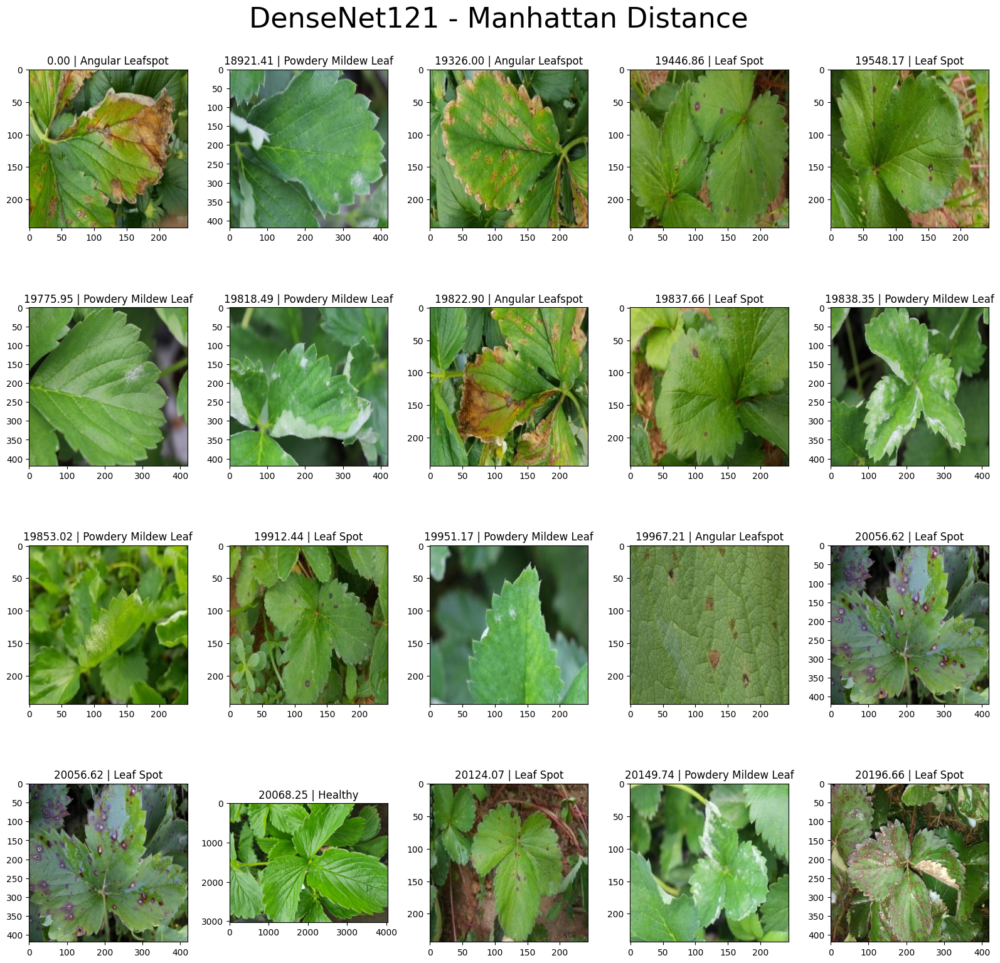

In [18]:
plt.figure(figsize=(16,16))
for i in range(20):
    distance = result_manhattan[i][0]
    label = result_manhattan[i][1].split("\\")[3]
    
    plt.subplot(4, 5, i+1)
    plt.title(str(f"{distance:.2f} | {label}"))
    plt.imshow(plt.imread(result_manhattan[i][1]))

plt.suptitle(f"{model_name} - Manhattan Distance", fontsize=32)
plt.tight_layout()
plt.show()

In [ ]:
def image_retrieval(query_image_path, progress_callback, top_k=20):
    query_features = extract_features(query_image_path)
    
    # Load cached features and images
    database_images = np.load("Strawberry_ResNet50V2.npy")
    database_features = np.load("StrawberryFeatures_ResNet50V2.npy")
     
    similarities = euclidean_distances(query_features.reshape(1, -1), database_features)
    similarities = manhattan_distances(query_features.reshape(1, -1), database_features)
    similarities = cosine_distances(query_features.reshape(1, -1), database_features)
    similarities = pairwise_distances(query_features.reshape(1, -1), database_features, metric='minkowski', p=3)
    
    top_k_indices = np.argsort(similarities.ravel())[:top_k]  # Sorting in ascending order
    
    retrieved_images = [database_images[i] for i in top_k_indices]
    retrieved_similarities = [similarities.ravel()[i] for i in top_k_indices]
    
    return retrieved_images, retrieved_similarities

In [20]:
class ImageRetrievalApp:
    def __init__(self, root):
        self.root = root
        self.root.title("Image Retrieval App")
        
        self.query_image_path = None
        
        # Browse button
        self.browse_button = tk.Button(root, text="Browse Image", command=self.browse_image)
        self.browse_button.pack(pady=20)
        
        # Query image label
        self.query_image_label = tk.Label(root, text="Query Image will be displayed here")
        self.query_image_label.pack()
        
        # Display frame for retrieved images
        self.results_frame = tk.Frame(root)
        self.results_frame.pack(pady=20)
        
        # Add progress bar
        self.progress = ttk.Progressbar(root, orient=tk.HORIZONTAL, length=300, mode='determinate')
        self.progress.pack(pady=20)

    def browse_image(self):
        self.query_image_path = filedialog.askopenfilename(filetypes=[("Image files", "*.jpg *.jpeg *.png *.bmp")])
        if self.query_image_path:
            self.display_query_image()
            # Start a new thread for the image retrieval process
            threading.Thread(target=self.display_retrieved_images).start()

    def display_query_image(self):
        query_img = Image.open(self.query_image_path)
        query_img = query_img.resize((100, 150), Image.Resampling.LANCZOS)
        query_img_tk = ImageTk.PhotoImage(query_img)
        
        self.query_image_label.config(image=query_img_tk, text="")
        self.query_image_label.image = query_img_tk

    def update_progress(self, current, total):
        self.progress['value'] = (current / total) * 100
        self.root.update_idletasks()

    def display_retrieved_images(self):
        for widget in self.results_frame.winfo_children():
            widget.destroy()
        
        retrieved_images, retrieved_similarities = image_retrieval(self.query_image_path, self.update_progress)
        
        query_label = self.query_image_path.split("/")[-2]
        # print(query_label)
        accuracy = 0
        for i, (image_path, similarity) in enumerate(zip(retrieved_images, retrieved_similarities)):
            img = Image.open(image_path)
            img = img.resize((100, 150), Image.Resampling.LANCZOS)
            img_tk = ImageTk.PhotoImage(img)
            
            label_img = tk.Label(self.results_frame, image=img_tk)
            label_img.image = img_tk
            label_img.grid(row=i // 5, column=i % 5, padx=10, pady=5)  # Decreased pady to provide space
            
            retrieval_label = image_path.split("\\")[1]
            if query_label == retrieval_label:
                accuracy +=1

            label_text = tk.Label(self.results_frame, text=f"{similarity:.2f} | {retrieval_label}")
            label_text.grid(row=i // 5, column=i % 5, padx=10, pady=(0, 5), sticky="n")  # Changed pady and added sticky

        tk.Label(self.results_frame, text=f"{query_label} Retrieval Accuracy: {accuracy * 5}%").grid(row=4, column=0, columnspan=5)
        print(f"{query_label} Retrieval Accuracy: {accuracy * 5}%")

In [ ]:
if __name__ == "__main__":
    root = tk.Tk()
    app = ImageRetrievalApp(root)
    root.mainloop()

# UI with Tkinter

In [ ]:
class ImageRetrievalApp:
    def __init__(self, root):
        self.root = root
        self.root.title("Enhanced Image Retrieval App")
        self.root.geometry("1100x1000")
        
        self.query_image_path = None
        self.query_features = None  # Store query features
        self.current_distance_metric = tk.StringVar(value="euclidean")
        self.current_distance_metric.trace('w', self.on_metric_change)  # Add trace for metric changes
        self.top_k = tk.IntVar(value=20)
        self.top_k.trace('w', self.on_metric_change)  # Also update when K changes
        
        self.setup_ui()
        self.load_config()
        
    def setup_ui(self):
        # Main container
        main_container = ttk.Frame(self.root)
        main_container.pack(fill=tk.BOTH, expand=True, padx=20, pady=20)
        
        # Left panel for controls
        left_panel = ttk.LabelFrame(main_container, text="Controls")
        left_panel.pack(side=tk.LEFT, fill=tk.Y, padx=(0, 20))
        
        # Browse button
        self.browse_button = ttk.Button(left_panel, text="Browse Image", command=self.browse_image)
        self.browse_button.pack(pady=10, padx=10, fill=tk.X)
        
        # Distance metric selection
        ttk.Label(left_panel, text="Distance Metric:").pack(pady=(10, 5), padx=10, anchor='w')
        metrics = ["euclidean", "manhattan", "cosine", "minkowski"]
        for metric in metrics:
            ttk.Radiobutton(
                left_panel,
                text=metric.capitalize(),
                variable=self.current_distance_metric,
                value=metric
            ).pack(pady=2, padx=10, anchor='w')
        
        # Top-K selection
        ttk.Label(left_panel, text="Number of Results (K):").pack(pady=(10, 5), padx=10)
        top_k_entry = ttk.Entry(left_panel, textvariable=self.top_k)
        top_k_entry.pack(pady=(0, 10), padx=10)
        
        # Query image frame
        query_frame = ttk.LabelFrame(main_container, text="Query Image")
        query_frame.pack(side=tk.LEFT, fill=tk.BOTH, padx=(0, 20))
        
        self.query_image_label = ttk.Label(query_frame, text="Query Image will be displayed here")
        self.query_image_label.pack(padx=10, pady=10)
        
        # Right panel for results
        right_panel = ttk.LabelFrame(main_container, text="Retrieved Images")
        right_panel.pack(side=tk.LEFT, fill=tk.BOTH, expand=True)
        
        # Canvas for scrollable results
        self.canvas = tk.Canvas(right_panel)
        scrollbar = ttk.Scrollbar(right_panel, orient=tk.VERTICAL, command=self.canvas.yview)
        self.results_frame = ttk.Frame(self.canvas)
        
        self.canvas.configure(yscrollcommand=scrollbar.set)
        
        scrollbar.pack(side=tk.RIGHT, fill=tk.Y)
        self.canvas.pack(side=tk.LEFT, fill=tk.BOTH, expand=True)
        
        self.canvas.create_window((0, 0), window=self.results_frame, anchor=tk.NW)
        self.results_frame.bind("<Configure>", self._on_frame_configure)
        
        # Progress bar with custom style
        self.progress_frame = ttk.Frame(self.root)
        self.progress_frame.pack(fill=tk.X, padx=20, pady=(0, 20))
        
        # Create custom style for green progress bar
        style = ttk.Style()
        style.configure("Green.Horizontal.TProgressbar", 
                       background='green',
                       troughcolor='light gray')
        
        self.progress = ttk.Progressbar(
            self.progress_frame,
            orient=tk.HORIZONTAL,
            length=300,
            mode='determinate',
            style="Green.Horizontal.TProgressbar"  # Apply green style
        )
        self.progress.pack(side=tk.LEFT, fill=tk.X, expand=True)
        
        self.progress_label = ttk.Label(self.progress_frame, text="0%")
        self.progress_label.pack(side=tk.LEFT, padx=(10, 0))
        
        # Status bar
        self.status_var = tk.StringVar(value="Ready")
        self.status_bar = ttk.Label(
            self.root,
            textvariable=self.status_var,
            relief=tk.SUNKEN,
            anchor=tk.W
        )
        self.status_bar.pack(fill=tk.X, padx=5, pady=5)

    def on_metric_change(self, *args):
        """Called when distance metric or K value changes"""
        if self.query_features is not None:  # Only update if we have a query image
            self.status_var.set("Updating results with new metric...")
            threading.Thread(target=self.display_retrieved_images, daemon=True).start()

    def load_config(self):
        try:
            with open('config.json', 'r') as f:
                config = json.load(f)
                self.last_directory = config.get('last_directory', os.getcwd())
        except FileNotFoundError:
            self.last_directory = os.getcwd()

    def save_config(self):
        config = {
            'last_directory': self.last_directory
        }
        with open('config.json', 'w') as f:
            json.dump(config, f)

    def _on_frame_configure(self, event=None):
        self.canvas.configure(scrollregion=self.canvas.bbox("all"))

    def browse_image(self):
        try:
            self.query_image_path = filedialog.askopenfilename(
                initialdir=self.last_directory,
                filetypes=[("Image files", "*.jpg *.jpeg *.png *.bmp")]
            )
            if self.query_image_path:
                self.last_directory = str(Path(self.query_image_path).parent)
                self.save_config()
                self.display_query_image()
                # Extract features when loading new image
                self.query_features = extract_features(self.query_image_path)
                self.status_var.set("Processing image...")
                threading.Thread(target=self.display_retrieved_images, daemon=True).start()
        except Exception as e:
            messagebox.showerror("Error", f"Error loading image: {str(e)}")
            self.query_features = None

    def display_query_image(self):
        try:
            query_img = Image.open(self.query_image_path)
            query_img.thumbnail((200, 300))
            query_img_tk = ImageTk.PhotoImage(query_img)
            
            self.query_image_label.configure(image=query_img_tk, text="")
            self.query_image_label.image = query_img_tk
        except Exception as e:
            messagebox.showerror("Error", f"Error displaying query image: {str(e)}")

    def update_progress(self, current, total):
        progress = (current / total) * 100
        self.progress['value'] = progress
        self.progress_label.configure(text=f"{progress:.1f}%")
        self.root.update_idletasks()

    def calculate_similarity(self, query_features, database_features):
        metric = self.current_distance_metric.get()
        if metric == "euclidean":
            return euclidean_distances(query_features.reshape(1, -1), database_features)
        elif metric == "manhattan":
            return manhattan_distances(query_features.reshape(1, -1), database_features)
        elif metric == "cosine":
            return cosine_distances(query_features.reshape(1, -1), database_features)
        elif metric == "minkowski":
            return pairwise_distances(query_features.reshape(1, -1), database_features, metric='minkowski', p=3)

    def display_retrieved_images(self):
        if self.query_features is None:
            self.status_var.set("No query image selected")
            return
            
        try:
            for widget in self.results_frame.winfo_children():
                widget.destroy()
            
            # Reset progress
            self.progress['value'] = 0
            self.progress_label.configure(text="0%")
            
            database_images = np.load("Strawberry_ResNet50V2.npy")
            database_features = np.load("StrawberryFeatures_ResNet50V2.npy")
            
            similarities = self.calculate_similarity(self.query_features, database_features)
            top_k = min(self.top_k.get(), len(database_images))
            top_k_indices = np.argsort(similarities.ravel())[:top_k]
            
            retrieved_images = [database_images[i] for i in top_k_indices]
            retrieved_similarities = [similarities.ravel()[i] for i in top_k_indices]
            
            query_label = Path(self.query_image_path).parent.name
            accuracy = 0
            
            for i, (image_path, similarity) in enumerate(zip(retrieved_images, retrieved_similarities)):
                self.update_progress(i + 1, len(retrieved_images))
                
                img = Image.open(image_path)
                img.thumbnail((100, 150))
                img_tk = ImageTk.PhotoImage(img)
                
                result_frame = ttk.Frame(self.results_frame)
                result_frame.grid(row=i // 5, column=i % 5, padx=10, pady=5, sticky="nsew")
                
                label_img = ttk.Label(result_frame, image=img_tk)
                label_img.image = img_tk
                label_img.pack()
                
                retrieval_label = Path(image_path).parent.name
                if query_label == retrieval_label:
                    accuracy += 1
                
                similarity_text = f"Similarity: {similarity:.4f}\nLabel: {retrieval_label}"
                label_text = ttk.Label(
                    result_frame,
                    text=similarity_text,
                    justify=tk.CENTER,
                    wraplength=100
                )
                label_text.pack(pady=(5, 0))
            
            accuracy_percentage = (accuracy / len(retrieved_images)) * 100
            accuracy_label = ttk.Label(
                self.results_frame,
                text=f"Retrieval Accuracy: {accuracy_percentage:.1f}%",
                font=('Arial', 10, 'bold')
            )
            accuracy_label.grid(row=(len(retrieved_images) // 5) + 1, column=0, columnspan=5, pady=10)
            
            self.status_var.set(f"Retrieved {len(retrieved_images)} images with {accuracy_percentage:.1f}% accuracy")
            
        except Exception as e:
            messagebox.showerror("Error", f"Error retrieving images: {str(e)}")
            self.status_var.set("Error occurred during retrieval")

In [ ]:
if __name__ == "__main__":
    try:
        root = tk.Tk()
        root.option_add('*tearOff', False)  # Disable tearoff menus
        style = ttk.Style()
        style.theme_use('clam')  # Or any other available theme
        
        app = ImageRetrievalApp(root)
        root.mainloop()
    except Exception as e:
        messagebox.showerror("Fatal Error", f"Application failed to start: {str(e)}")

NameError: name 'messagebox' is not defined